# WoFS Heights, Winds, and Potential Temperature

In this notebook, we will read in post-processed WoFS runs for the Hurricane Ida case, separate the wettest and driest ensemble members in terms of 1–2Z rainfall in NYC, and look at differences in the geopotential height, wind, and potential temperature fields.

## Setup

In [1]:
# Import statements
import xarray as xr
from scipy.ndimage import gaussian_filter
import cartopy.crs as ccrs
from metpy.plots import ctables
import numpy as np
from xskillscore import resample_iterations_idx
from dask.diagnostics.progress import ProgressBar
import dask
import matplotlib.pyplot as plt
import matplotlib as mpl
import cartopy.feature as cfeature
from typing import List
import matplotlib.patches as patches

plt.style.use("dark_background")
mpl.rcParams["hatch.linewidth"] = 0.2

In [2]:
# Define functions
def get_wofs_all(init: int) -> xr.Dataset:
    """Read in WoFS output based on initialization time."""
    file_pattern = f"/mnt/drive2/new-wofs/{init:02d}Z/wofs_ALL*.nc"
    loaded = xr.open_mfdataset(
        file_pattern, combine="nested", concat_dim="time", chunks="auto"
    )

    if init < 6:
        start_time = f"2021-09-02 {init:02d}:00:00"
        end_time = f"2021-09-02 {init + 6:02d}:00:00"
    else:
        start_time = f"2021-09-01 {init:02d}:00:00"
        end_time = f"2021-09-02 {init - 24 + 6:02d}:00:00"

    loaded["time"] = xr.cftime_range(start_time, end_time, freq="5min")
    return loaded


def overwrite_ne(da: xr.DataArray | xr.Dataset) -> xr.DataArray | xr.Dataset:
    """Overwrite 'ne' values in the DataArray or Dataset."""
    da["ne"] = range(5)
    return da


def smooth(da: xr.DataArray, sigma: int = 3, axes: tuple = (1, 2)) -> xr.DataArray:
    """Apply Gaussian smoothing to the DataArray."""
    smoothed_da = da.copy()
    smoothed_da.values = gaussian_filter(da.values, sigma=sigma, axes=axes)
    smoothed_da = smoothed_da.assign_attrs(da.attrs)
    return smoothed_da


def stack_and_chunk(data_arrays, dim_name, chunk_size):
    """Concatenate, stack, and chunk the given data arrays."""
    return (
        xr.concat(data_arrays, dim=dim_name)
        .stack(run=(dim_name, "ne"))
        .chunk({"run": chunk_size})
    )


def process_variable(
    wofs_list: List[xr.Dataset], var_name: str, overwrite: bool = False
) -> xr.DataArray:
    """Process a variable data with optional 'ne' overwrite."""
    data_arrays = [
        overwrite_ne(getattr(ds, var_name)) if overwrite else getattr(ds, var_name)
        for ds in wofs_list
    ]
    return stack_and_chunk(data_arrays, "init", "auto" if overwrite else -1)


def process_and_smooth(data, times, smooth_data=True, sigma=5):
    """Process and optionally smooth data for selected times."""
    selected_data = xr.concat([data.sel(time=time).squeeze() for time in times], dim='time').compute()
    if smooth_data:
        if isinstance(selected_data, xr.Dataset):
            # Apply smoothing to each variable in the Dataset
            smoothed_data = selected_data.map_blocks(lambda ds: ds.map(lambda x: smooth(x, sigma=sigma)))
            smoothed_data = smoothed_data.assign_attrs(data.attrs)
        elif isinstance(selected_data, xr.DataArray):
            smoothed_data = smooth(selected_data, sigma=sigma)
        return smoothed_data
    return selected_data



# Function to perform resampling and compute means
def resample_and_compute_means(
    data, time, lat_chunk=50, lon_chunk=50, iterations=1000, dim_max=20
):
    chunked_data = (
        data.sel(time=time).squeeze().chunk({"lat": lat_chunk, "lon": lon_chunk})
    )
    set1 = resample_iterations_idx(
        chunked_data, iterations, dim="run", replace=False, dim_max=dim_max
    ).mean(dim="run")
    set2 = resample_iterations_idx(
        chunked_data, iterations, dim="run", replace=False, dim_max=dim_max
    ).mean(dim="run")
    return set1, set2


# Function to compute differences and quantiles
def compute_difference_and_quantiles(set1, set2):
    return (set1 - set2).quantile([0.05, 0.95], dim="iteration").compute()


def calc_theta(T: xr.DataArray, p: int) -> xr.DataArray:
    """Calculate potential temperature in Kelvin."""
    return (T + 273.15) * ((1000 / p) ** 0.286)


# Compute masks
def compute_mask(diff, results):
    return (diff < results.sel(quantile=0.05).squeeze()) | (
        diff > results.sel(quantile=0.95).squeeze()
    )


def process_theta(wofs_list, level, overwrite=False):
    """Process temperature data and calculate potential temperature."""
    temp_var = f"temperature_{level}"
    theta = process_variable(wofs_list, temp_var, overwrite)
    return calc_theta(theta, level)


def process_winds(wofs_list, level, overwrite=False):
    """Process wind data and merge U and V components."""
    u_var = f"U_{level}"
    v_var = f"V_{level}"
    u_data = process_variable(wofs_list, u_var, overwrite)
    v_data = process_variable(wofs_list, v_var, overwrite)
    return xr.merge([u_data, v_data])


def set_lat_lon(dataarrays, step=3000, size=900000):
    """Set lat/lon values."""
    for da in dataarrays:
        da["lat"] = range(0, size, step)
        da["lon"] = range(0, size, step)


def calculate_gradient(theta):
    """Calculate gradients along x and y."""
    grad_x = theta.differentiate("lon")
    grad_y = theta.differentiate("lat")
    return grad_x, grad_y


def calculate_advection(uv, grad_x, grad_y):
    """Calculate temperature advection."""
    level = uv.attrs["level"].lstrip("P")  # Remove 'P' prefix
    u = uv[f"U_{level}"]  # .chunk(grad_x.chunks)
    v = uv[f"V_{level}"]  # .chunk(grad_y.chunks)
    return (-u * grad_x) + (-v * grad_y)

# Process temperature data and select times of interest
def process_and_select_theta(wofs_list, level, times, overwrite=False):
    """Process and select temperature data for specific times."""
    theta = process_theta(wofs_list, level, overwrite)
    selected_theta = xr.concat([theta.sel(time=time) for time in times], dim='time')
    return selected_theta

In [3]:
# Read in WoFS initializations 20–23Z
wofs_all = [get_wofs_all(i) for i in [20,21,22,23]]

In [4]:
# Define variables and parameters
lat = wofs_all[0].xlat.isel(time=0).squeeze().drop_vars("time")
lon = wofs_all[0].xlon.isel(time=0).squeeze().drop_vars("time")

# Set up Cartopy projection
proj = ccrs.LambertConformal(
    central_longitude=wofs_all[0].attrs["CEN_LON"],
    central_latitude=wofs_all[0].attrs["CEN_LAT"],
    standard_parallels=(30, 60),
)  # WoFS projection

# Get MetPy colortables
precip_cmap = ctables.registry.get_colortable("precipitation")
refl_cmap = ctables.registry.get_colortable("NWSReflectivity")

# Create a DataArray for the initialization dimension
init = xr.DataArray(data=["20Z", "21Z", "22Z", "23Z"], dims="init").assign_coords(
    {"init": ["20Z", "21Z", "22Z", "23Z"]}
)

## Create wet & dry ensembles

In [5]:
# Set desired latitude and longitude (Central Park)
nyc_lat, nyc_lon = 40.7826, -73.9656

# Calculate Euclidean distance and find the nearest indices
distance = np.sqrt((lat - nyc_lat) ** 2 + (lon - nyc_lon) ** 2)
nyc_inds = distance.argmin(dim=["NY", "NX"])
lat_ind, lon_ind = int(nyc_inds["NY"]), int(nyc_inds["NX"])

# Sort by Central Park precipitation
rain_nyc_0102 = [
    w.rain.isel(lat=lat_ind, lon=lon_ind)
    .sel(time=slice("2021-09-02 01:05:00", "2021-09-02 02:00:00"))
    .sum(dim="time")
    .squeeze()
    for w in wofs_all
]

# Get indices of wettest and driest ensemble members
ne_wet = [
    r.ne.where(r > r.quantile(0.75, dim="ne")).dropna(dim="ne") for r in rain_nyc_0102
]
ne_dry = [
    r.ne.where(r < r.quantile(0.25, dim="ne")).dropna(dim="ne") for r in rain_nyc_0102
]

# Select wet and dry members
wofs_wet = [w.sel(ne=ne_wet[i].astype(int)) for i, w in enumerate(wofs_all)]
wofs_dry = [w.sel(ne=ne_dry[i].astype(int)) for i, w in enumerate(wofs_all)]

## Geopotential heights

In [13]:
# Process data for all, wet, and dry conditions at different height levels
z500_all = process_variable(wofs_all, "geo_hgt_500")
z500_wet = process_variable(wofs_wet, "geo_hgt_500", overwrite=True)
z500_dry = process_variable(wofs_dry, "geo_hgt_500", overwrite=True)

z700_all = process_variable(wofs_all, "geo_hgt_700")
z700_wet = process_variable(wofs_wet, "geo_hgt_700", overwrite=True)
z700_dry = process_variable(wofs_dry, "geo_hgt_700", overwrite=True)

z850_all = process_variable(wofs_all, "geo_hgt_850")
z850_wet = process_variable(wofs_wet, "geo_hgt_850", overwrite=True)
z850_dry = process_variable(wofs_dry, "geo_hgt_850", overwrite=True)

In [17]:
# Time steps to iterate over
times = ["2021-09-01 23:00:00", "2021-09-02 00:00:00"]
results_z500, results_z700, results_z850 = [], [], []

# Use Dask for parallel processing
with ProgressBar():
    for time in times:
        z500_set1, z500_set2 = resample_and_compute_means(z500_all, time)
        z700_set1, z700_set2 = resample_and_compute_means(z700_all, time)
        z850_set1, z850_set2 = resample_and_compute_means(z850_all, time)
        
        results_z500.append(dask.delayed(compute_difference_and_quantiles)(z500_set1, z500_set2))
        results_z700.append(dask.delayed(compute_difference_and_quantiles)(z700_set1, z700_set2))
        results_z850.append(dask.delayed(compute_difference_and_quantiles)(z850_set1, z850_set2))

    # Compute all results in parallel
    results_z500 = dask.compute(*results_z500)
    results_z700 = dask.compute(*results_z700)
    results_z850 = dask.compute(*results_z850)

# Combine results along the new time dimension
results_z500 = xr.concat(results_z500, dim="time")
results_z700 = xr.concat(results_z700, dim="time")
results_z850 = xr.concat(results_z850, dim="time")

[########################################] | 100% Completed | 44.53 s
[########################################] | 100% Completed | 42.56 ss
[########################################] | 100% Completed | 42.40 ss


In [18]:
with ProgressBar():
    z500_wet = process_and_smooth(z500_wet, times)
    z500_dry = process_and_smooth(z500_dry, times)
    z700_wet = process_and_smooth(z700_wet, times)
    z700_dry = process_and_smooth(z700_dry, times)
    z850_wet = process_and_smooth(z850_wet, times)
    z850_dry = process_and_smooth(z850_dry, times)

# Compute differences
z500_diff = z500_wet - z500_dry
z700_diff = z700_wet - z700_dry
z850_diff = z850_wet - z850_dry


# Compute masks
def compute_mask(diff, results):
    return (diff < results.sel(quantile=0.05).squeeze()) | (
        diff > results.sel(quantile=0.95).squeeze()
    )


z500_mask = compute_mask(z500_diff, results_z500)
z700_mask = compute_mask(z700_diff, results_z700)
z850_mask = compute_mask(z850_diff, results_z850)

[########################################] | 100% Completed | 1.23 sms
[########################################] | 100% Completed | 623.63 ms
[########################################] | 100% Completed | 619.75 ms
[########################################] | 100% Completed | 519.95 ms
[########################################] | 100% Completed | 518.96 ms
[########################################] | 100% Completed | 523.46 ms


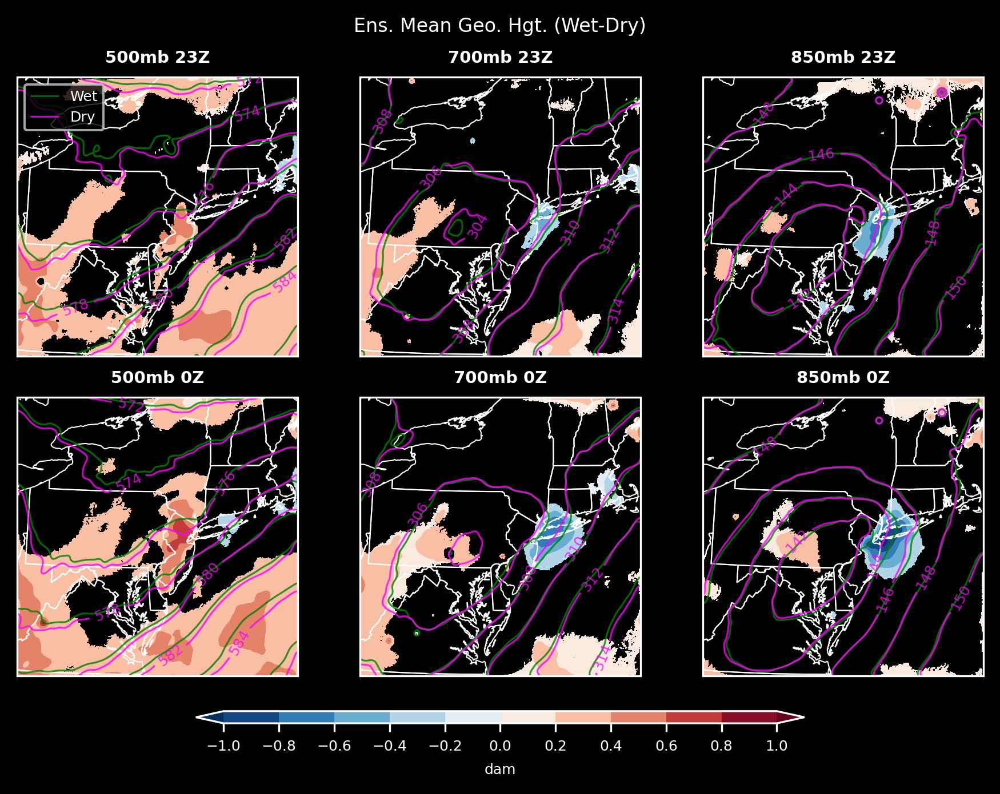

In [56]:
# Define titles, times, and levels
titles = ["500mb 23Z", "700mb 23Z", "850mb 23Z", "500mb 0Z", "700mb 0Z", "850mb 0Z"]
times = ["2021-09-01 23:00:00", "2021-09-02 00:00:00"]
diff_levs = np.arange(-1, 1.1, 0.2)
levs = range(100, 600, 2)
labels = ["Wet", "Dry"]

# Prepare data for plotting
diffs = [
    zl.sel(time=t).squeeze() for t in times for zl in [z500_diff, z700_diff, z850_diff]
]
wets = [
    zl.sel(time=t).squeeze() for t in times for zl in [z500_wet, z700_wet, z850_wet]
]
drys = [
    zl.sel(time=t).squeeze() for t in times for zl in [z500_dry, z700_dry, z850_dry]
]
masks = [
    zl.sel(time=t).squeeze() for t in times for zl in [z500_mask, z700_mask, z850_mask]
]

# Create a figure with 2 by 3 subplots
fig, axes = plt.subplots(
    2,
    3,
    figsize=(6, 4.5),
    dpi=300,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

# Iterate through axes and plot
for i, ax in enumerate(axes.flat):
    # Plot the difference, but only where significant
    cf = ax.contourf(
        lon,
        lat,
        diffs[i].where(masks[i]) / 10,
        transform=ccrs.PlateCarree(),
        levels=diff_levs,
        cmap="RdBu_r",
        extend="both",
    )

    # Add state lines
    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="white")

    # Overlay z500_wet and z500_dry contours
    c1 = ax.contour(
        lon,
        lat,
        wets[i] / 10,
        transform=ccrs.PlateCarree(),
        levels=levs,
        linewidths=0.75,
        colors="green",
        alpha=0.8,
    )
    c2 = ax.contour(
        lon,
        lat,
        drys[i] / 10,
        transform=ccrs.PlateCarree(),
        levels=levs,
        linewidths=0.75,
        colors="magenta",
        alpha=0.8,
    )
    c2.clabel(inline=True, fontsize=6, fmt="%d")

    # Set title
    ax.set_title(titles[i], fontsize=7, fontweight="bold")

    # Add legend to the first plot
    if i == 0:
        h1, _ = c1.legend_elements()
        h2, _ = c2.legend_elements()
        ax.legend([h1[0], h2[0]], labels, fontsize=6)

# Add one colorbar to the entire plot
cbar = fig.colorbar(
    cf, ax=axes, shrink=0.6, aspect=50, orientation="horizontal", extend="both"
)
cbar.ax.tick_params(labelsize=6)
cbar.set_label("dam", fontsize=6)
cbar.set_ticks(diff_levs)

# Set suptitle
plt.suptitle("Ens. Mean Geo. Hgt. (Wet-Dry)", fontsize=8)

# Show plot
plt.show()

## Winds

In [6]:
# Load in the data
uv500_all = xr.merge(
    [process_variable(wofs_all, "U_500"), process_variable(wofs_all, "V_500")]
)
uv500_wet = xr.merge(
    [
        process_variable(wofs_wet, "U_500", overwrite=True),
        process_variable(wofs_wet, "V_500", overwrite=True),
    ]
)
uv500_dry = xr.merge(
    [
        process_variable(wofs_dry, "U_500", overwrite=True),
        process_variable(wofs_dry, "V_500", overwrite=True),
    ]
)

# Load in the data
uv700_all = xr.merge(
    [process_variable(wofs_all, "U_700"), process_variable(wofs_all, "V_700")]
)
uv700_wet = xr.merge(
    [
        process_variable(wofs_wet, "U_700", overwrite=True),
        process_variable(wofs_wet, "V_700", overwrite=True),
    ]
)
uv700_dry = xr.merge(
    [
        process_variable(wofs_dry, "U_700", overwrite=True),
        process_variable(wofs_dry, "V_700", overwrite=True),
    ]
)

# Load in the data
uv850_all = xr.merge(
    [process_variable(wofs_all, "U_850"), process_variable(wofs_all, "V_850")]
)
uv850_wet = xr.merge(
    [
        process_variable(wofs_wet, "U_850", overwrite=True),
        process_variable(wofs_wet, "V_850", overwrite=True),
    ]
)
uv850_dry = xr.merge(
    [
        process_variable(wofs_dry, "U_850", overwrite=True),
        process_variable(wofs_dry, "V_850", overwrite=True),
    ]
)

In [7]:
times = ["2021-09-01 23:00:00", "2021-09-02 00:00:00"]

with ProgressBar():
    uv500_wet = process_and_smooth(uv500_wet, times, smooth_data=False)
    uv500_dry = process_and_smooth(uv500_dry, times, smooth_data=False)
    uv700_wet = process_and_smooth(uv700_wet, times, smooth_data=False)
    uv700_dry = process_and_smooth(uv700_dry, times, smooth_data=False)
    uv850_wet = process_and_smooth(uv850_wet, times, smooth_data=False)
    uv850_dry = process_and_smooth(uv850_dry, times, smooth_data=False)

# Compute layer average
ulayer_wet = (((uv500_wet.U_500+uv700_wet.U_700)*(200/2) + (uv700_wet.U_700+uv850_wet.U_850)*(150/2))/350).rename("U_LAYER")
vlayer_wet = (((uv500_wet.V_500+uv700_wet.V_700)*(200/2) + (uv700_wet.V_700+uv850_wet.V_850)*(150/2))/350).rename("V_LAYER")
ulayer_dry = (((uv500_dry.U_500+uv700_dry.U_700)*(200/2) + (uv700_dry.U_700+uv850_dry.U_850)*(150/2))/350).rename("U_LAYER")
vlayer_dry = (((uv500_dry.V_500+uv700_dry.V_700)*(200/2) + (uv700_dry.V_700+uv850_dry.V_850)*(150/2))/350).rename("V_LAYER")

uvlayer_wet = xr.merge([ulayer_wet,vlayer_wet])
uvlayer_dry = xr.merge([ulayer_dry,vlayer_dry])

# Compute differences
uv500_diff = uv500_wet - uv500_dry
uv700_diff = uv700_wet - uv700_dry
uv850_diff = uv850_wet - uv850_dry
uvlayer_diff = uvlayer_wet - uvlayer_dry

[########################################] | 100% Completed | 2.23 sms
[########################################] | 100% Completed | 618.93 ms
[########################################] | 100% Completed | 1.53 sms
[########################################] | 100% Completed | 622.16 ms
[########################################] | 100% Completed | 1.43 sms
[########################################] | 100% Completed | 622.16 ms


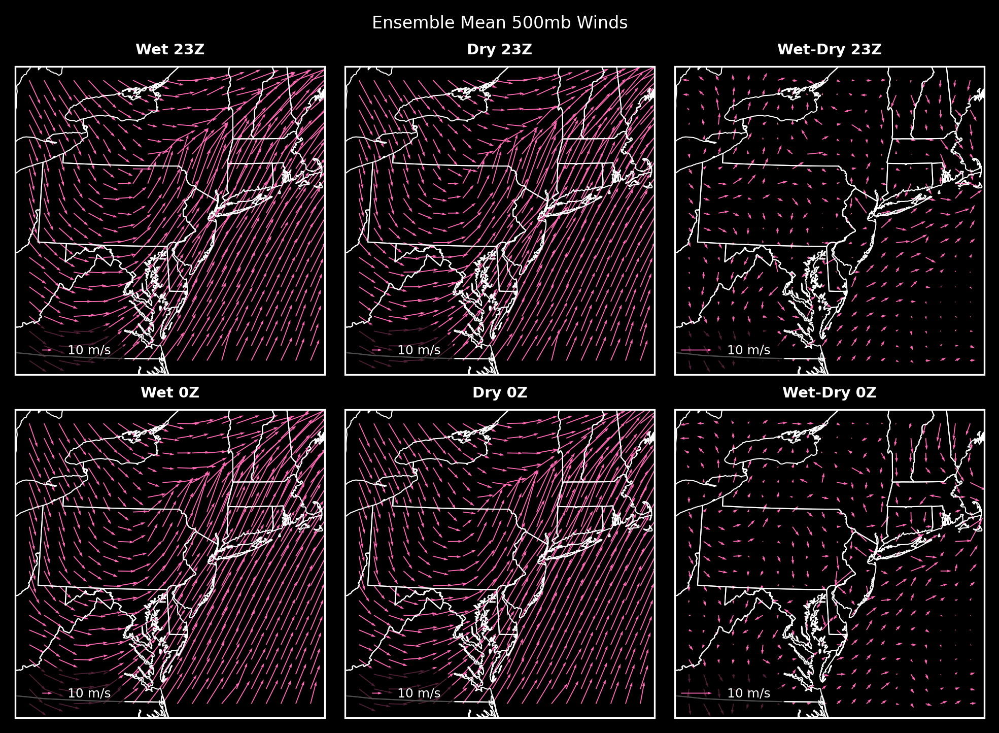

In [21]:
# Titles
titles = ["Wet 23Z","Dry 23Z","Wet-Dry 23Z",
          "Wet 0Z","Dry 0Z","Wet-Dry 0Z"]

# Take every 10th lat and lon values
lon_quiv = lon.values[::15,::15]
lat_quiv = lat.values[::15,::15]
scales = [300,300,100,300,300,100]

# Isolate wind vectors
winds = [data.isel(time=t).squeeze().isel(lat=slice(None,None,15),lon=slice(None,None,15))
         for t in range(2)
         for data in [uv500_wet, uv500_dry, uv500_diff]]


fig, axes = plt.subplots(
    2,
    3,
    figsize=(6.5, 4.7),
    dpi=300,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

for i,ax in enumerate(axes.flat): # type: ignore
    q = ax.quiver(
        lon_quiv,
        lat_quiv,
        winds[i].U_500.values,
        winds[i].V_500.values,
        transform=ccrs.PlateCarree(),
        scale=scales[i],
        color="hotpink",
    )

    # add state boundaries
    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="white")

    # Add title
    ax.set_title(titles[i],fontsize=7,fontweight="bold")

    # Add a reference vector with a background rectangle
    bbox = patches.FancyBboxPatch((0.1, 0.05), 0.15, 0.01,
                                  boxstyle="round,pad=0.1",
                                  transform=ax.transAxes,
                                  color='black',
                                  alpha=0.7,
                                  zorder=2)
    ax.add_patch(bbox)
    qk = ax.quiverkey(q, 0.12, 0.08, 10, '10 m/s', labelpos='E', coordinates='axes', fontproperties={'size': 6}, color='hotpink')
    qk.set_zorder(3)

# Set suptitle
plt.suptitle("Ensemble Mean 500mb Winds",fontsize=8)

plt.show()

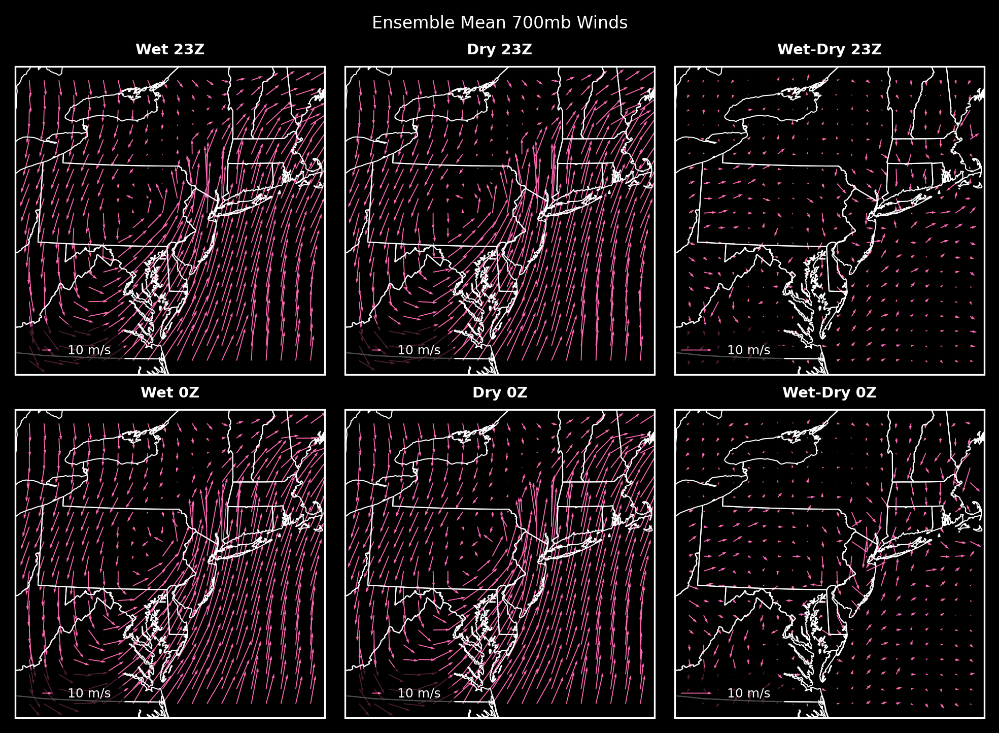

In [23]:
# Titles
titles = ["Wet 23Z","Dry 23Z","Wet-Dry 23Z",
          "Wet 0Z","Dry 0Z","Wet-Dry 0Z"]

# Take every 10th lat and lon values
lon_quiv = lon.values[::15,::15]
lat_quiv = lat.values[::15,::15]
scales = [300,300,100,300,300,100]

# Isolate wind vectors
winds = [data.isel(time=t).squeeze().isel(lat=slice(None,None,15),lon=slice(None,None,15))
         for t in range(2)
         for data in [uv700_wet, uv700_dry, uv700_diff]]


fig, axes = plt.subplots(
    2,
    3,
    figsize=(6.5, 4.7),
    dpi=300,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

for i,ax in enumerate(axes.flat): # type: ignore
    q = ax.quiver(
        lon_quiv,
        lat_quiv,
        winds[i].U_700.values,
        winds[i].V_700.values,
        transform=ccrs.PlateCarree(),
        scale=scales[i],
        color="hotpink",
    )

    # add state boundaries
    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="white")

    # Add title
    ax.set_title(titles[i],fontsize=7,fontweight="bold")

    # Add a reference vector with a background rectangle
    bbox = patches.FancyBboxPatch((0.1, 0.05), 0.15, 0.01,
                                  boxstyle="round,pad=0.1",
                                  transform=ax.transAxes,
                                  color='black',
                                  alpha=0.7,
                                  zorder=2)
    ax.add_patch(bbox)
    qk = ax.quiverkey(q, 0.12, 0.08, 10, '10 m/s', labelpos='E', coordinates='axes', fontproperties={'size': 6}, color='hotpink')
    qk.set_zorder(3)

# Set suptitle
plt.suptitle("Ensemble Mean 700mb Winds",fontsize=8)

plt.show()

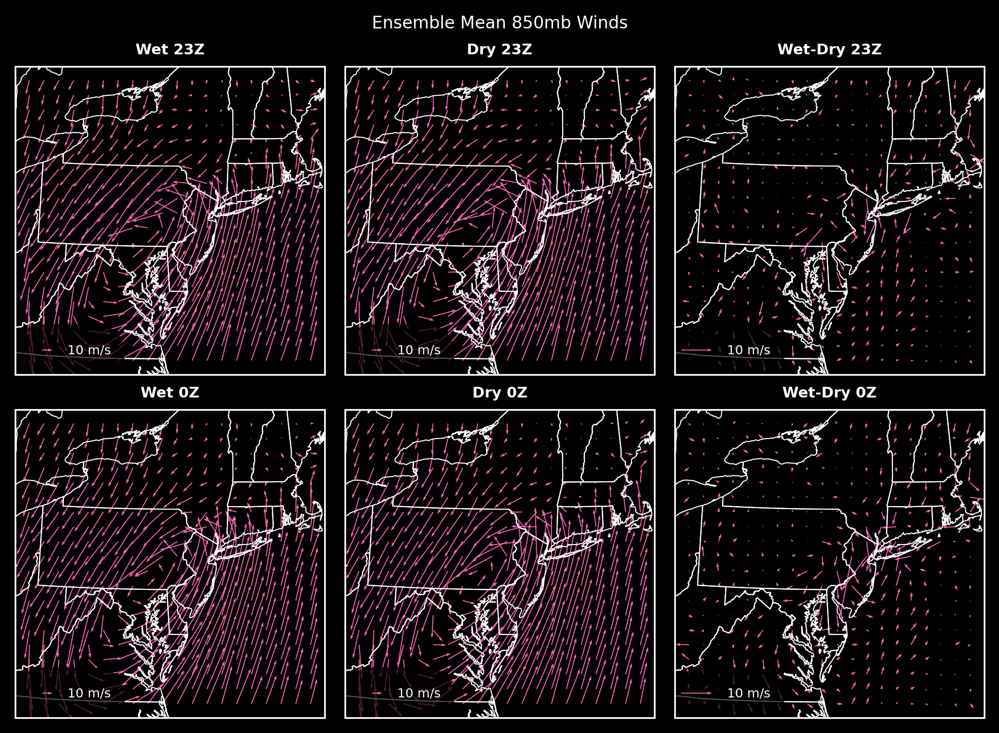

In [24]:
# Titles
titles = ["Wet 23Z","Dry 23Z","Wet-Dry 23Z",
          "Wet 0Z","Dry 0Z","Wet-Dry 0Z"]

# Take every 10th lat and lon values
lon_quiv = lon.values[::15,::15]
lat_quiv = lat.values[::15,::15]
scales = [300,300,100,300,300,100]

# Isolate wind vectors
winds = [data.isel(time=t).squeeze().isel(lat=slice(None,None,15),lon=slice(None,None,15))
         for t in range(2)
         for data in [uv850_wet, uv850_dry, uv850_diff]]


fig, axes = plt.subplots(
    2,
    3,
    figsize=(6.5, 4.7),
    dpi=300,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

for i,ax in enumerate(axes.flat): # type: ignore
    q = ax.quiver(
        lon_quiv,
        lat_quiv,
        winds[i].U_850.values,
        winds[i].V_850.values,
        transform=ccrs.PlateCarree(),
        scale=scales[i],
        color="hotpink",
    )

    # add state boundaries
    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="white")

    # Add title
    ax.set_title(titles[i],fontsize=7,fontweight="bold")

    # Add a reference vector with a background rectangle
    bbox = patches.FancyBboxPatch((0.1, 0.05), 0.15, 0.01,
                                  boxstyle="round,pad=0.1",
                                  transform=ax.transAxes,
                                  color='black',
                                  alpha=0.7,
                                  zorder=2)
    ax.add_patch(bbox)
    qk = ax.quiverkey(q, 0.12, 0.08, 10, '10 m/s', labelpos='E', coordinates='axes', fontproperties={'size': 6}, color='hotpink')
    qk.set_zorder(3)

# Set suptitle
plt.suptitle("Ensemble Mean 850mb Winds",fontsize=8)

plt.show()

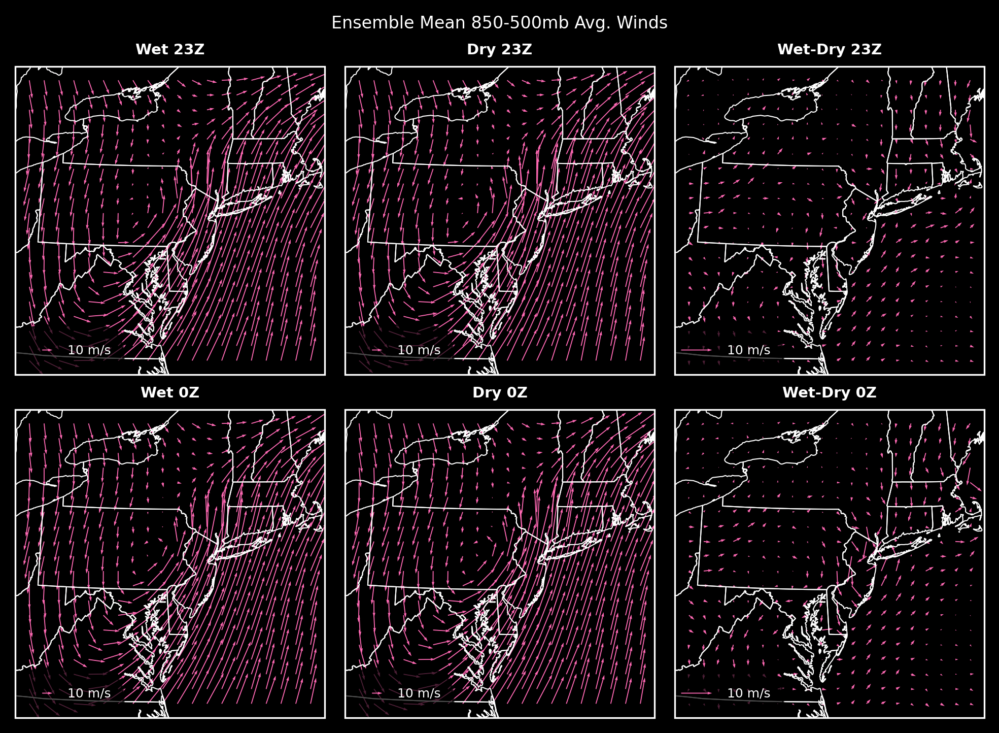

In [34]:
# Titles
titles = ["Wet 23Z","Dry 23Z","Wet-Dry 23Z",
          "Wet 0Z","Dry 0Z","Wet-Dry 0Z"]

# Take every 10th lat and lon values
lon_quiv = lon.values[::15,::15]
lat_quiv = lat.values[::15,::15]
scales = [300,300,100,300,300,100]

# Isolate wind vectors
winds = [data.isel(time=t).squeeze().isel(lat=slice(None,None,15),lon=slice(None,None,15))
         for t in range(2)
         for data in [uvlayer_wet, uvlayer_dry, uvlayer_diff]]


fig, axes = plt.subplots(
    2,
    3,
    figsize=(6.5, 4.7),
    dpi=300,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

for i,ax in enumerate(axes.flat): # type: ignore
    q = ax.quiver(
        lon_quiv,
        lat_quiv,
        winds[i].U_LAYER.values,
        winds[i].V_LAYER.values,
        transform=ccrs.PlateCarree(),
        scale=scales[i],
        color="hotpink",
    )

    # add state boundaries
    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="white")

    # Add title
    ax.set_title(titles[i],fontsize=7,fontweight="bold")

    # Add a reference vector with a background rectangle
    bbox = patches.FancyBboxPatch((0.1, 0.05), 0.15, 0.01,
                                  boxstyle="round,pad=0.1",
                                  transform=ax.transAxes,
                                  color='black',
                                  alpha=0.7,
                                  zorder=2)
    ax.add_patch(bbox)
    qk = ax.quiverkey(q, 0.12, 0.08, 10, '10 m/s', labelpos='E', coordinates='axes', fontproperties={'size': 6}, color='hotpink')
    qk.set_zorder(3)

# Set suptitle
plt.suptitle("Ensemble Mean 850-500mb Avg. Winds",fontsize=8)

plt.show()

## Theta

In [8]:
# Process temperature data for all, wet, and dry conditions at 850mb
theta850_all = calc_theta(process_variable(wofs_all, "temperature_850"),850)
theta850_wet = calc_theta(process_variable(wofs_wet, "temperature_850", overwrite=True),850)
theta850_dry = calc_theta(process_variable(wofs_dry, "temperature_850", overwrite=True),850)

theta700_all = calc_theta(process_variable(wofs_all, "temperature_700"),700)
theta700_wet = calc_theta(process_variable(wofs_wet, "temperature_700", overwrite=True),700)
theta700_dry = calc_theta(process_variable(wofs_dry, "temperature_700", overwrite=True),700)

In [10]:
times = ["2021-09-01 23:00:00", "2021-09-02 00:00:00"]
results_850, results_700 = [],[]

# Use Dask for parallel processing
with ProgressBar():
    for time in times:
        theta850_set1, theta850_set2 = resample_and_compute_means(theta850_all, time)
        theta700_set1, theta700_set2 = resample_and_compute_means(theta700_all, time)
        
        results_850.append(dask.delayed(compute_difference_and_quantiles)(theta850_set1, theta850_set2))
        results_700.append(dask.delayed(compute_difference_and_quantiles)(theta700_set1, theta700_set2))

    # Compute all results in parallel
    results_850 = dask.compute(*results_850)
    results_700 = dask.compute(*results_700)

# Combine results along the new time dimension
results_850 = xr.concat(results_850, dim="time")
results_700 = xr.concat(results_700, dim="time")

[###                                     ] | 9% Completed | 338.12 ms

[########################################] | 100% Completed | 43.73 ss
[########################################] | 100% Completed | 44.78 ss


In [11]:
with ProgressBar():
    theta850_wet = process_and_smooth(theta850_wet, times)
    theta850_dry = process_and_smooth(theta850_dry, times)
    theta700_wet = process_and_smooth(theta700_wet, times)
    theta700_dry = process_and_smooth(theta700_dry, times)

# Compute differences
theta850_diff = theta850_wet - theta850_dry
theta700_diff = theta700_wet - theta700_dry

theta850_mask = compute_mask(theta850_diff, results_850)
theta700_mask = compute_mask(theta700_diff, results_700)

[########################################] | 100% Completed | 1.43 sms
[########################################] | 100% Completed | 617.78 ms
[########################################] | 100% Completed | 620.67 ms
[########################################] | 100% Completed | 620.94 ms


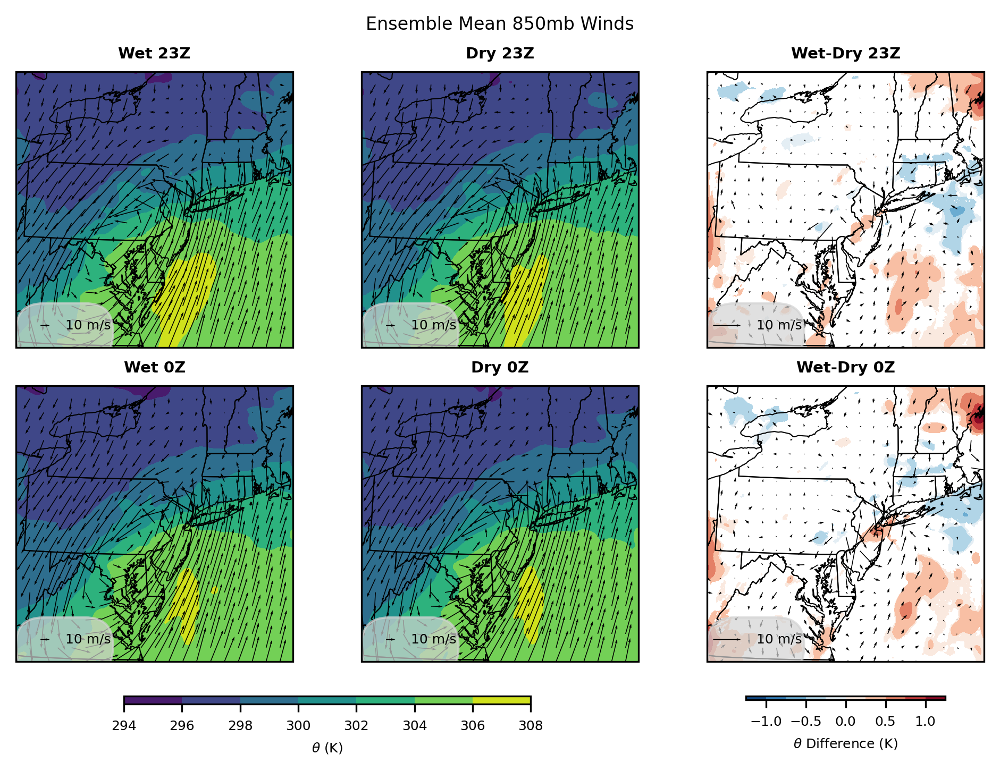

In [85]:
plt.style.use("default")

# Titles
titles = ["Wet 23Z", "Dry 23Z", "Wet-Dry 23Z", "Wet 0Z", "Dry 0Z", "Wet-Dry 0Z"]

# Take every 10th lat and lon values
lon_quiv = lon.values[::15, ::15]
lat_quiv = lat.values[::15, ::15]
scales = [300, 300, 100, 300, 300, 100]

# Isolate wind vectors
winds = [
    data.isel(time=t)
    .squeeze()
    .isel(lat=slice(None, None, 15), lon=slice(None, None, 15))
    for t in range(2)
    for data in [uv850_wet, uv850_dry, uv850_diff]
]
thetas = [
    data.isel(time=t).squeeze()
    for t in range(2)
    for data in [theta850_wet, theta850_dry, theta850_diff]
]
masks = [theta850_mask.isel(time=t) for t in range(2)]

fig, axes = plt.subplots(
    2,
    3,
    figsize=(6.5, 4.7),
    dpi=300,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

cf_objs = []

for i, ax in enumerate(axes.flat):  # type: ignore
    if i not in [2, 5]:
        levs = range(294, 309, 2)
        cmap = "viridis"
        mask = np.ones(thetas[i].values.shape)
    else:
        mask = masks[i % 2]
        levs = np.arange(-1.25, 1.26, 0.25)
        cmap = "RdBu_r"
    
    cf = ax.contourf(
        lon,
        lat,
        thetas[i].where(mask).values,
        transform=ccrs.PlateCarree(),
        levels=levs,
        cmap=cmap
    )
    cf_objs.append(cf)

    q = ax.quiver(
        lon_quiv,
        lat_quiv,
        winds[i].U_850.values,
        winds[i].V_850.values,
        transform=ccrs.PlateCarree(),
        scale=scales[i],
        color="black",
    )

    # add state boundaries
    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="black")

    # Add title
    ax.set_title(titles[i], fontsize=7, fontweight="bold")

    # Add a reference vector with a background rectangle
    bbox = patches.FancyBboxPatch((0.1, 0.05), 0.15, 0.01,
                                  boxstyle="round,pad=0.1",
                                  transform=ax.transAxes,
                                  color='lightgray',
                                  alpha=0.7,
                                  zorder=2)
    ax.add_patch(bbox)
    qk = ax.quiverkey(q, 0.12, 0.08, 10, '10 m/s', labelpos='E', coordinates='axes', fontproperties={'size': 6}, color='black')
    qk.set_zorder(3)

# Add shared colorbars
cbar1 = fig.colorbar(
    cf_objs[0], ax=axes[:, :2], shrink=0.6, aspect=50, orientation="horizontal", extend="both"
)
cbar1.ax.tick_params(labelsize=6)
cbar1.set_label(r"$\theta$ (K)", fontsize=6)
cbar1.set_ticks(range(294, 309, 2))

# Add separate colorbar for the last column
cbar2 = fig.colorbar(
    cf_objs[2], ax=axes[:, 2], shrink=0.6, aspect=50, orientation="horizontal", extend="both"
)
cbar2.ax.tick_params(labelsize=6)
cbar2.set_label(r"$\theta$ Difference (K)", fontsize=6)

# Set suptitle
plt.suptitle("Ensemble Mean 850mb Winds", fontsize=8)

plt.show()

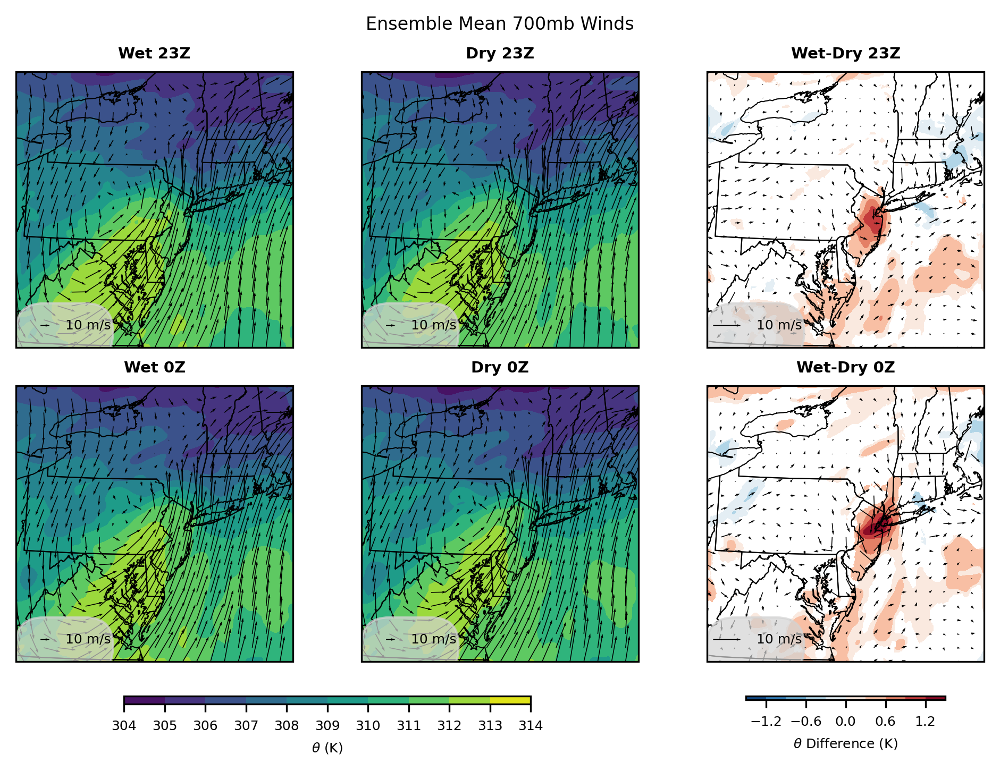

In [18]:
plt.style.use("default")

# Titles
titles = ["Wet 23Z", "Dry 23Z", "Wet-Dry 23Z", "Wet 0Z", "Dry 0Z", "Wet-Dry 0Z"]

# Take every 10th lat and lon values
lon_quiv = lon.values[::15, ::15]
lat_quiv = lat.values[::15, ::15]
scales = [300, 300, 100, 300, 300, 100]

# Isolate wind vectors
winds = [
    data.isel(time=t)
    .squeeze()
    .isel(lat=slice(None, None, 15), lon=slice(None, None, 15))
    for t in range(2)
    for data in [uv700_wet, uv700_dry, uv700_diff]
]
thetas = [
    data.isel(time=t).squeeze()
    for t in range(2)
    for data in [theta700_wet, theta700_dry, theta700_diff]
]
masks = [theta700_mask.isel(time=t) for t in range(2)]

fig, axes = plt.subplots(
    2,
    3,
    figsize=(6.5, 4.7),
    dpi=300,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

cf_objs = []

for i, ax in enumerate(axes.flat):  # type: ignore
    if i not in [2, 5]:
        levs = range(304, 315, 1)
        cmap = "viridis"
        mask = np.ones(thetas[i].values.shape)
    else:
        mask = masks[i % 2]
        levs = np.arange(-1.5, 1.6, 0.3)
        cmap = "RdBu_r"
    
    cf = ax.contourf(
        lon,
        lat,
        thetas[i].where(mask).values,
        transform=ccrs.PlateCarree(),
        levels=levs,
        cmap=cmap
    )
    cf_objs.append(cf)

    q = ax.quiver(
        lon_quiv,
        lat_quiv,
        winds[i].U_700.values,
        winds[i].V_700.values,
        transform=ccrs.PlateCarree(),
        scale=scales[i],
        color="black",
    )

    # add state boundaries
    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="black")

    # Add title
    ax.set_title(titles[i], fontsize=7, fontweight="bold")

    # Add a reference vector with a background rectangle
    bbox = patches.FancyBboxPatch((0.1, 0.05), 0.15, 0.01,
                                  boxstyle="round,pad=0.1",
                                  transform=ax.transAxes,
                                  color='lightgray',
                                  alpha=0.7,
                                  zorder=2)
    ax.add_patch(bbox)
    qk = ax.quiverkey(q, 0.12, 0.08, 10, '10 m/s', labelpos='E', coordinates='axes', fontproperties={'size': 6}, color='black')
    qk.set_zorder(3)

# Add shared colorbars
cbar1 = fig.colorbar(
    cf_objs[0], ax=axes[:, :2], shrink=0.6, aspect=50, orientation="horizontal", extend="both"
)
cbar1.ax.tick_params(labelsize=6)
cbar1.set_label(r"$\theta$ (K)", fontsize=6)
cbar1.set_ticks(range(304, 315, 1))

# Add separate colorbar for the last column
cbar2 = fig.colorbar(
    cf_objs[2], ax=axes[:, 2], shrink=0.6, aspect=50, orientation="horizontal", extend="both"
)
cbar2.ax.tick_params(labelsize=6)
cbar2.set_label(r"$\theta$ Difference (K)", fontsize=6)

# Set suptitle
plt.suptitle("Ensemble Mean 700mb Winds", fontsize=8)

plt.show()

## Temperature advection

In [6]:
times = ["2021-09-01 23:00:00","2021-09-02 00:00:00"]

theta850_all = process_and_select_theta(wofs_all, 850, times)
theta850_wet = process_and_select_theta(wofs_wet, 850, times, overwrite=True)
theta850_dry = process_and_select_theta(wofs_dry, 850, times, overwrite=True)

theta700_all = process_and_select_theta(wofs_all, 700, times)
theta700_wet = process_and_select_theta(wofs_wet, 700, times, overwrite=True)
theta700_dry = process_and_select_theta(wofs_dry, 700, times, overwrite=True)

# Process wind data
uv500_all = process_winds(wofs_all, 500)
uv500_wet = process_winds(wofs_wet, 500, overwrite=True)
uv500_dry = process_winds(wofs_dry, 500, overwrite=True)

uv700_all = process_winds(wofs_all, 700)
uv700_wet = process_winds(wofs_wet, 700, overwrite=True)
uv700_dry = process_winds(wofs_dry, 700, overwrite=True)

uv850_all = process_winds(wofs_all, 850)
uv850_wet = process_winds(wofs_wet, 850, overwrite=True)
uv850_dry = process_winds(wofs_dry, 850, overwrite=True)

# Set lat/lon values
set_lat_lon(
    [
        theta850_all,
        theta850_wet,
        theta850_dry,
        theta700_all,
        theta700_wet,
        theta700_dry,
        uv850_all,
        uv850_wet,
        uv850_dry,
        uv700_all,
        uv700_wet,
        uv700_dry,
    ]
)

# Smooth the data
with ProgressBar():
    theta850_all = process_and_smooth(theta850_all, times, smooth_data=True, sigma=5)
    theta850_wet = process_and_smooth(theta850_wet, times, smooth_data=True, sigma=5)
    theta850_dry = process_and_smooth(theta850_dry, times, smooth_data=True, sigma=5)

    theta700_all = process_and_smooth(theta700_all, times, smooth_data=True, sigma=5)
    theta700_wet = process_and_smooth(theta700_wet, times, smooth_data=True, sigma=5)
    theta700_dry = process_and_smooth(theta700_dry, times, smooth_data=True, sigma=5)

    uv700_all = process_and_smooth(uv700_all, times, smooth_data=True, sigma=5)
    uv700_wet = process_and_smooth(uv700_wet, times, smooth_data=True, sigma=5)
    uv700_dry = process_and_smooth(uv700_dry, times, smooth_data=True, sigma=5)

    uv850_all = process_and_smooth(uv850_all, times, smooth_data=True, sigma=5)
    uv850_wet = process_and_smooth(uv850_wet, times, smooth_data=True, sigma=5)
    uv850_dry = process_and_smooth(uv850_dry, times, smooth_data=True, sigma=5)

# Calculate temperature gradients
theta850_all_gradx, theta850_all_grady = calculate_gradient(theta850_all)
theta850_wet_gradx, theta850_wet_grady = calculate_gradient(theta850_wet)
theta850_dry_gradx, theta850_dry_grady = calculate_gradient(theta850_dry)

theta700_all_gradx, theta700_all_grady = calculate_gradient(theta700_all)
theta700_wet_gradx, theta700_wet_grady = calculate_gradient(theta700_wet)
theta700_dry_gradx, theta700_dry_grady = calculate_gradient(theta700_dry)

# Calculate temperature advection
tadv850_all = calculate_advection(uv850_all, theta850_all_gradx, theta850_all_grady)
tadv850_wet = calculate_advection(uv850_wet, theta850_wet_gradx, theta850_wet_grady)
tadv850_dry = calculate_advection(uv850_dry, theta850_dry_gradx, theta850_dry_grady)

tadv700_all = calculate_advection(uv700_all, theta700_all_gradx, theta700_all_grady)
tadv700_wet = calculate_advection(uv700_wet, theta700_wet_gradx, theta700_wet_grady)
tadv700_dry = calculate_advection(uv700_dry, theta700_dry_gradx, theta700_dry_grady)

[########################################] | 100% Completed | 1.12 sms
[########################################] | 100% Completed | 615.03 ms
[########################################] | 100% Completed | 513.28 ms
[########################################] | 100% Completed | 607.77 ms
[########################################] | 100% Completed | 414.50 ms
[########################################] | 100% Completed | 414.44 ms
[########################################] | 100% Completed | 1.22 sms
[########################################] | 100% Completed | 419.44 ms
[########################################] | 100% Completed | 417.42 ms
[########################################] | 100% Completed | 1.22 sms
[########################################] | 100% Completed | 415.25 ms
[########################################] | 100% Completed | 416.95 ms


In [7]:
results_850, results_700 = [], []

# Use Dask for parallel processing
with ProgressBar():
    for time in times:
        tadv850_set1, tadv850_set2 = resample_and_compute_means(tadv850_all, time)
        tadv700_set1, tadv700_set2 = resample_and_compute_means(tadv700_all, time)

        results_850.append(dask.delayed(compute_difference_and_quantiles)(tadv850_set1, tadv850_set2))
        results_700.append(dask.delayed(compute_difference_and_quantiles)(tadv700_set1, tadv700_set2))

    # Compute all results in parallel
    results_850 = dask.compute(*results_850)
    results_700 = dask.compute(*results_700)

# Combine results along the new time dimension
results_850 = xr.concat(results_850, dim="time")
results_700 = xr.concat(results_700, dim="time")

# Take ensemble means of wet and dry tadv
tadv850_wet,tadv850_dry = tadv850_wet.mean(dim="run"), tadv850_dry.mean(dim="run")
tadv700_wet,tadv700_dry = tadv700_wet.mean(dim="run"), tadv700_dry.mean(dim="run")

# Compute differences
tadv850_diff = tadv850_wet - tadv850_dry
tadv700_diff = tadv700_wet - tadv700_dry

tadv850_mask = compute_mask(tadv850_diff, results_850)
tadv700_mask = compute_mask(tadv700_diff, results_700)

[                                        ] | 0% Completed | 875.58 us

[########################################] | 100% Completed | 48.99 ss
[########################################] | 100% Completed | 48.15 ss


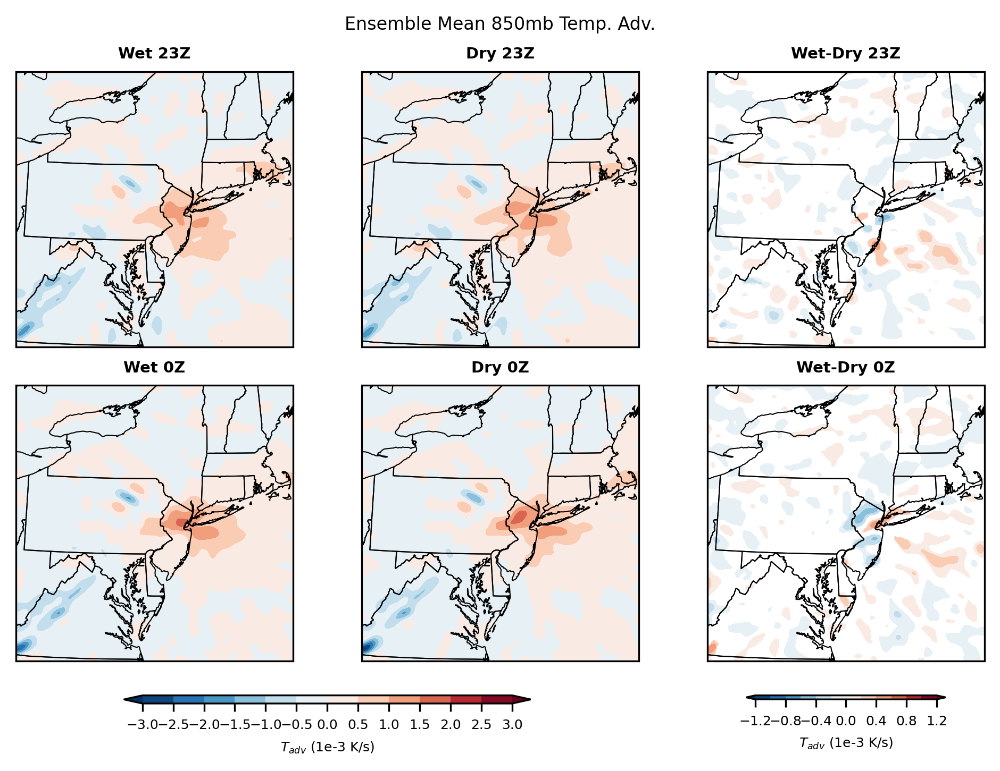

In [8]:
plt.style.use("default")

# Titles
titles = ["Wet 23Z", "Dry 23Z", "Wet-Dry 23Z", "Wet 0Z", "Dry 0Z", "Wet-Dry 0Z"]

# Take every 10th lat and lon values
lon_quiv = lon.values[::15, ::15]
lat_quiv = lat.values[::15, ::15]
scales = [300, 300, 100, 300, 300, 100]

tadvs = [
    data.isel(time=t).squeeze()
    for t in range(2)
    for data in [tadv850_wet, tadv850_dry, tadv850_diff]
]
masks = [tadv850_mask.isel(time=t) for t in range(2)]

fig, axes = plt.subplots(
    2,
    3,
    figsize=(6.5, 4.7),
    dpi=300,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

cf_objs = []

for i, ax in enumerate(axes.flat):  # type: ignore
    cmap="RdBu_r"
    if i not in [2, 5]:
        levs = np.arange(-3,3.5,0.5)
        mask = np.ones(tadvs[i].values.shape)
    else:
        mask = masks[i % 2]
        levs = np.arange(-1.2, 1.3, 0.2)
    
    cf = ax.contourf(
        lon,
        lat,
        tadvs[i].where(mask).values * 1e3,
        transform=ccrs.PlateCarree(),
        levels=levs,
        cmap=cmap,
        extend="both"
    )
    cf_objs.append(cf)

    # add state boundaries
    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="black")

    # Add title
    ax.set_title(titles[i], fontsize=7, fontweight="bold")

# Add shared colorbars
cbar1 = fig.colorbar(
    cf_objs[0], ax=axes[:, :2], shrink=0.6, aspect=50, orientation="horizontal", extend="both"
)
cbar1.ax.tick_params(labelsize=6)
cbar1.set_label(r"$T_{adv}$ (1e-3 K/s)", fontsize=6)
cbar1.set_ticks(np.arange(-3,3.5,0.5))

# Add separate colorbar for the last column
cbar2 = fig.colorbar(
    cf_objs[2], ax=axes[:, 2], shrink=0.6, aspect=50, orientation="horizontal", extend="both"
)
cbar2.ax.tick_params(labelsize=6)
cbar2.set_label(r"$T_{adv}$ (1e-3 K/s)", fontsize=6)

# Set suptitle
plt.suptitle("Ensemble Mean 850mb Temp. Adv.", fontsize=8)

plt.show()

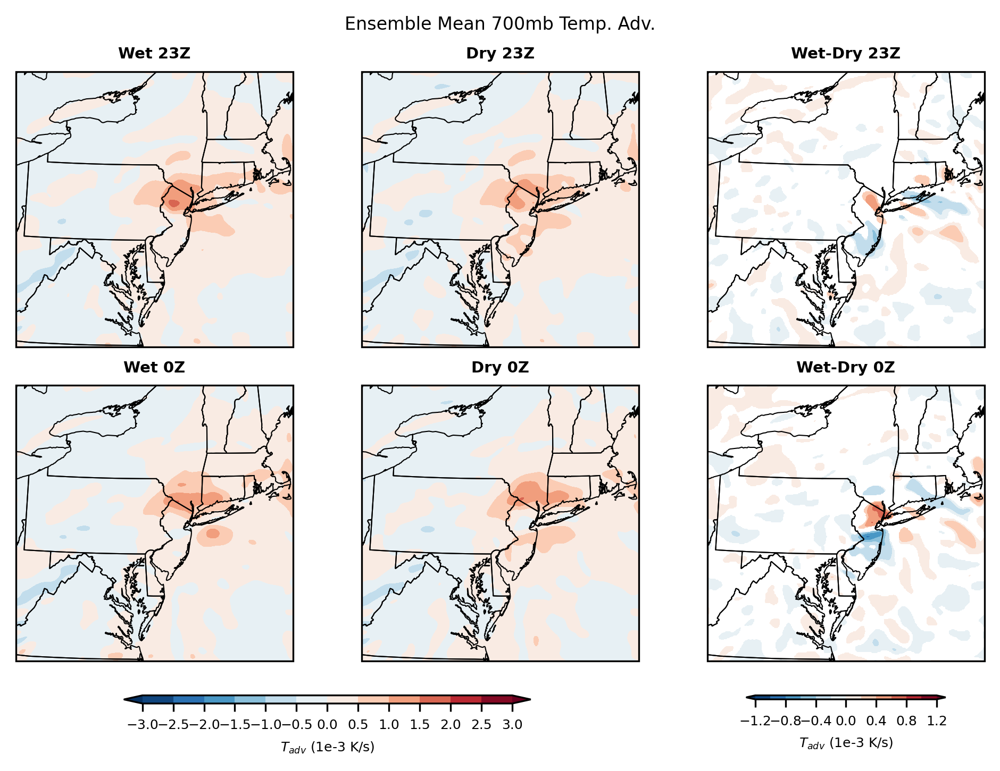

In [9]:
plt.style.use("default")

# Titles
titles = ["Wet 23Z", "Dry 23Z", "Wet-Dry 23Z", "Wet 0Z", "Dry 0Z", "Wet-Dry 0Z"]

# Take every 10th lat and lon values
lon_quiv = lon.values[::15, ::15]
lat_quiv = lat.values[::15, ::15]
scales = [300, 300, 100, 300, 300, 100]

tadvs = [
    data.isel(time=t).squeeze()
    for t in range(2)
    for data in [tadv700_wet, tadv700_dry, tadv700_diff]
]
masks = [tadv700_mask.isel(time=t) for t in range(2)]

fig, axes = plt.subplots(
    2,
    3,
    figsize=(6.5, 4.7),
    dpi=300,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

cf_objs = []

for i, ax in enumerate(axes.flat):  # type: ignore
    cmap="RdBu_r"
    if i not in [2, 5]:
        levs = np.arange(-3,3.5,0.5)
        mask = np.ones(tadvs[i].values.shape)
    else:
        mask = masks[i % 2]
        levs = np.arange(-1.2, 1.3, 0.2)
    
    cf = ax.contourf(
        lon,
        lat,
        tadvs[i].where(mask).values * 1e3,
        transform=ccrs.PlateCarree(),
        levels=levs,
        cmap=cmap,
        extend="both"
    )
    cf_objs.append(cf)

    # add state boundaries
    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="black")

    # Add title
    ax.set_title(titles[i], fontsize=7, fontweight="bold")

# Add shared colorbars
cbar1 = fig.colorbar(
    cf_objs[0], ax=axes[:, :2], shrink=0.6, aspect=50, orientation="horizontal", extend="both"
)
cbar1.ax.tick_params(labelsize=6)
cbar1.set_label(r"$T_{adv}$ (1e-3 K/s)", fontsize=6)
cbar1.set_ticks(np.arange(-3,3.5,0.5))

# Add separate colorbar for the last column
cbar2 = fig.colorbar(
    cf_objs[2], ax=axes[:, 2], shrink=0.6, aspect=50, orientation="horizontal", extend="both"
)
cbar2.ax.tick_params(labelsize=6)
cbar2.set_label(r"$T_{adv}$ (1e-3 K/s)", fontsize=6)

# Set suptitle
plt.suptitle("Ensemble Mean 700mb Temp. Adv.", fontsize=8)

plt.show()